# PRELUDE

Before starting this notebook, I want you to explore the examples of commercial SAR data in data/commercial_cog. There are a few examples. There are examples of Stripmap, Sliding Spotlight, and Spotlight modes. Pay attention to how the resolution of individual structures changes between the different modes.

**QUESTION (20 pts):**
The scene 

CAPELLA_C13_SP_GEO_HH_20250601220547_20250601220630_preview

shows the immediate aftermath (same day scene acquisition) of a Ukrainian drone attack on Belaya air base in central Russia on June 01 2025. This scene is a good example of what intact vs destroyed small structures look like in commercial SAR data. Intelligence agencies reported based on this scene that 3 large and 4 smaller aircraft were destroyed. Spend a few minutes looking through this scene, and print screen 2-3 examples of destroyed aircraft, and 2-3 examples of in-tack aircraft. Upload your examples as a separate pdf with a brief description of how you made this distinction. This type of analysis is common in both intelligence and disaster response applications, as structures destroyed by wildfire/earthquakes/hurricanes/etc. will show similar features, but those tend to be very messy scenes and difficult to interperet. 

**ANSWER: Upload examples along with this notebook.**
Examples annotated in the file `aircraft-annotations.pdf`.

# Ship Detection in Commercial SAR Subsets

You have already explored commercial SAR scenes outside this notebook. Here you will process a prepared subset containing ships and build a simple brightness-based ship-candidate detector.

The detector identifies bright object candidates. It does not prove that an object is a ship.

This workflow is designed to get you familiar with the types of problems being addressed with commercial SAR data. There are 

## Learning objectives

By the end of this notebook, you should be able to load a SAR subset, display it, test brightness thresholds, group bright pixels into connected components, filter candidate objects, draw bounding boxes, and explain false positives.

In [3]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

from scipy.ndimage import label, find_objects, binary_closing
from matplotlib.patches import Rectangle

## 2. Read one SAR subset

We are using a commercial SAR preview COG. Pixel values are 8-bit display brightness values. We will use them for visual interpretation and simple bright-target detection, not calibrated radiometric analysis.

In [4]:
#SCENE_INDEX = 0

path = r"./data/commercial_cog_subset/ship_subset.tif"

with rasterio.open(path) as src:
    arr = src.read(1)
    meta = {
        "width": src.width,
        "height": src.height,
        "count": src.count,
        "dtype": src.dtypes,
        "crs": src.crs,
        "resolution": src.res,
        "bounds": src.bounds,
        "nodata": src.nodata,
    }

print()
for k, v in meta.items():
    print(f"{k}: {v}")

print("Array shape:", arr.shape)
print("Array dtype:", arr.dtype)
print("Min/max:", np.nanmin(arr), np.nanmax(arr))

nodata = meta["nodata"] if meta["nodata"] is not None else 0
valid = np.isfinite(arr) & (arr != nodata)
print("Valid percentiles:", np.nanpercentile(arr[valid], [1, 50, 95, 99, 99.8, 99.9]))

/var/folders/fm/yw1smwgd3tdcfrcvzsq0zgcc0000gp/T/ipykernel_42786/523408371.py:6: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  arr = src.read(1)



width: 9381
height: 8141
count: 1
dtype: ('uint8',)
crs: EPSG:32618
resolution: (0.34999999999999054, 0.34999999999999054)
bounds: BoundingBox(left=579373.1451899222, bottom=4500843.217511419, right=582656.495189922, top=4503692.567511419)
nodata: 0.0
Array shape: (8141, 9381)
Array dtype: uint8
Min/max: 1 255
Valid percentiles: [  1.  22.  72.  85. 136. 158.]


## 3. Display the SAR subset

For Capella preview imagery, values may already be 8-bit display values. We use a percentile stretch and ignore nodata.

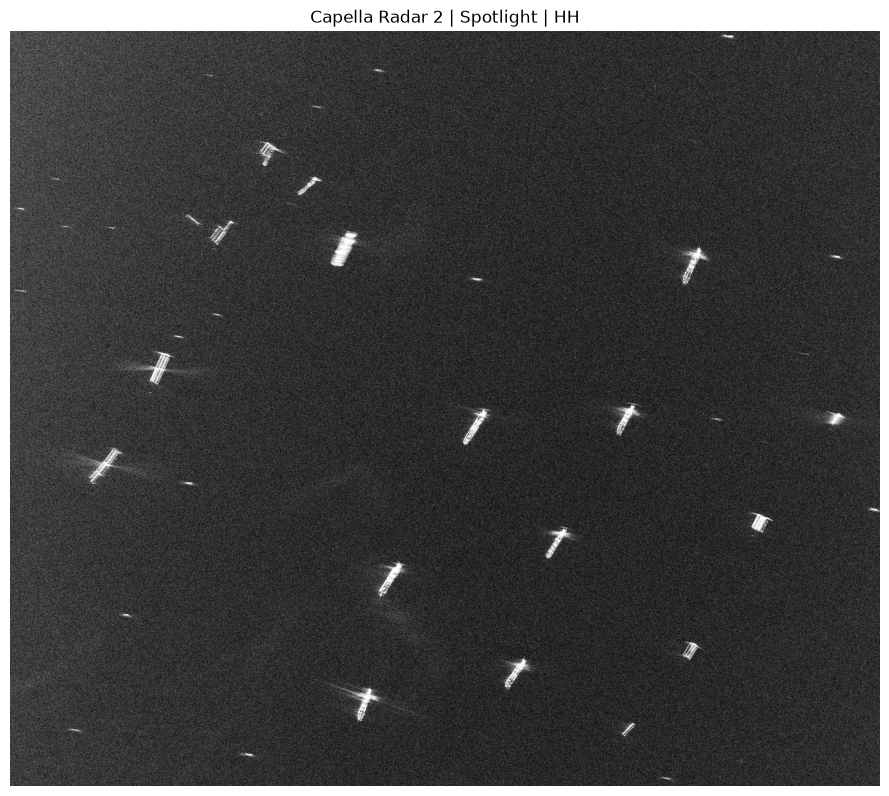

In [5]:
def display_sar(arr, pmin=1, pmax=99.8, nodata=0):
    img = arr.astype("float32").copy()
    if nodata is not None:
        img[img == nodata] = np.nan

    finite = np.isfinite(img)
    if not finite.any():
        return np.zeros_like(img, dtype="float32")

    lo, hi = np.nanpercentile(img[finite], [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0, 1)

def plot_sar(arr, title="", pmin=1, pmax=99.8, nodata=0, figsize=(9, 9)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    plt.figure(figsize=figsize)
    plt.imshow(disp, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

plot_sar(arr, title=f"Capella Radar 2 | Spotlight | HH", nodata=nodata)

### Questions

1. Identify several bright targets that are likely ships.
2. Do all ships appear as single blobs?
**QUESTION (5 pts):Zoom in very closely to some large ships in your GIS program. Do all ships still appear as single blobs? What might be some difficulty in designing a detector that can isolate single ships vs multiple clustered ships?**

**ANSWER:**
1. Identify several bright targets that are likely ships.

Annotated in file `ships-anotations.pdf`

2. Zoom in very closely to some large ships in your GIS program. Do all ships still appear as single blobs?

In the case of bigger ships, they appear as pretty much detailed structures. We can even see some internal ship structures.

The difficulty that I see regarding designing a detector that can isolate single ships vs. multiple clustered ships is the backscatter bloom that is sometimes produced that might interfere with other ship structures when they are close to each other.

## 4. Test brightness thresholds

A first simple detector is: `ship candidate pixel = brightness >= threshold`.

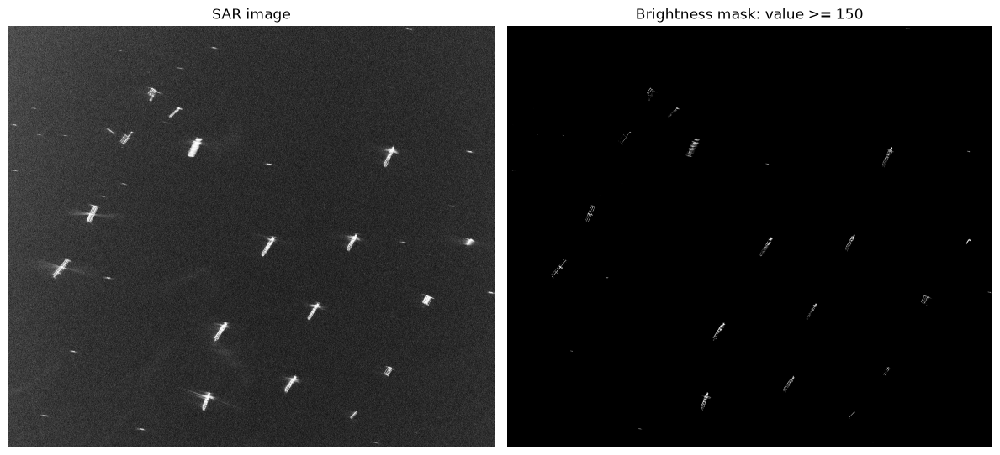

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.0013614641663524428


In [6]:
def plot_threshold_mask(arr, threshold, nodata=0, pmin=1, pmax=99.8):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata
    mask = (img >= threshold) & valid

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata), cmap="gray")
    axes[0].set_title("SAR image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title(f"Brightness mask: value >= {threshold}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    print("Pixels above threshold:", int(mask.sum()))
    print("Fraction of valid pixels above threshold:", float(mask.sum() / valid.sum()))
    return mask

mask = plot_threshold_mask(arr, threshold=150, nodata=nodata)

The brightest ships show here, but this misses smaller ships. We will need a smaller threshold to capture as many ships as we can. Test a few different thresholds below. 


Threshold: 50


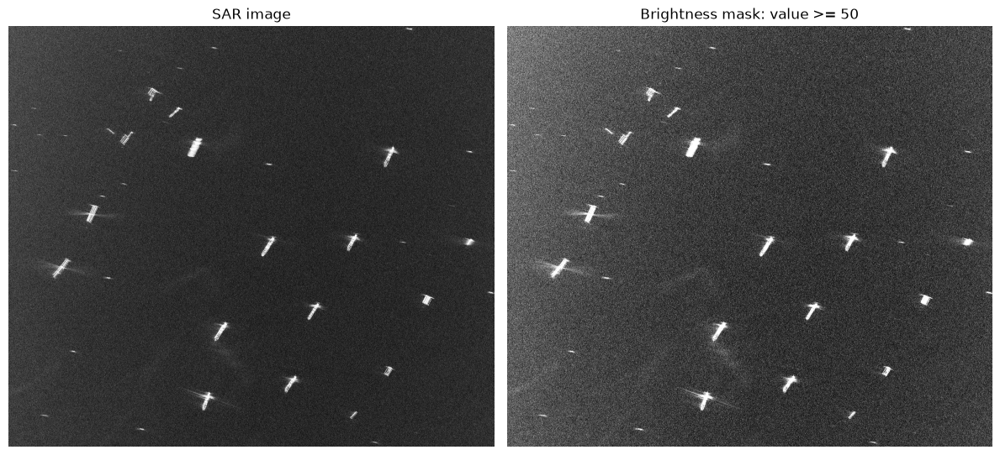

Pixels above threshold: 20156597
Fraction of valid pixels above threshold: 0.2639309507108097

Threshold: 80


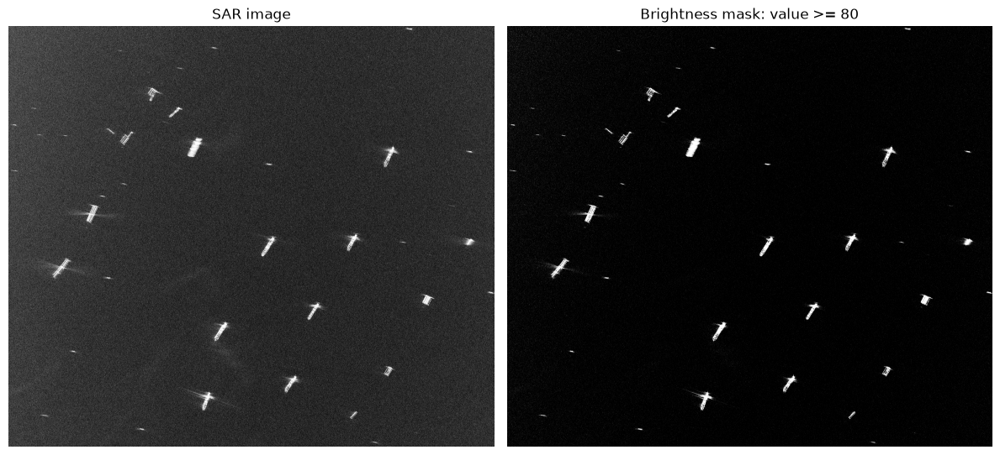

Pixels above threshold: 1437115
Fraction of valid pixels above threshold: 0.018817617290793943

Threshold: 90


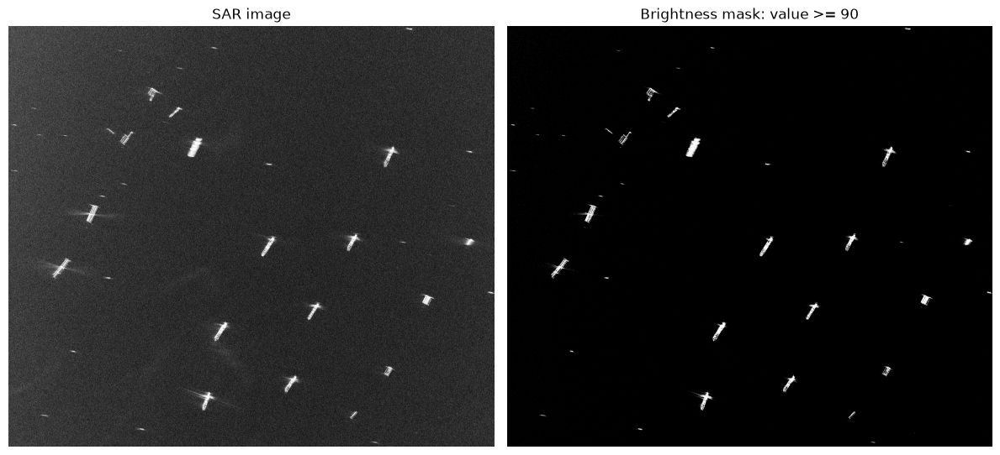

Pixels above threshold: 475287
Fraction of valid pixels above threshold: 0.006223419050868984

Threshold: 100


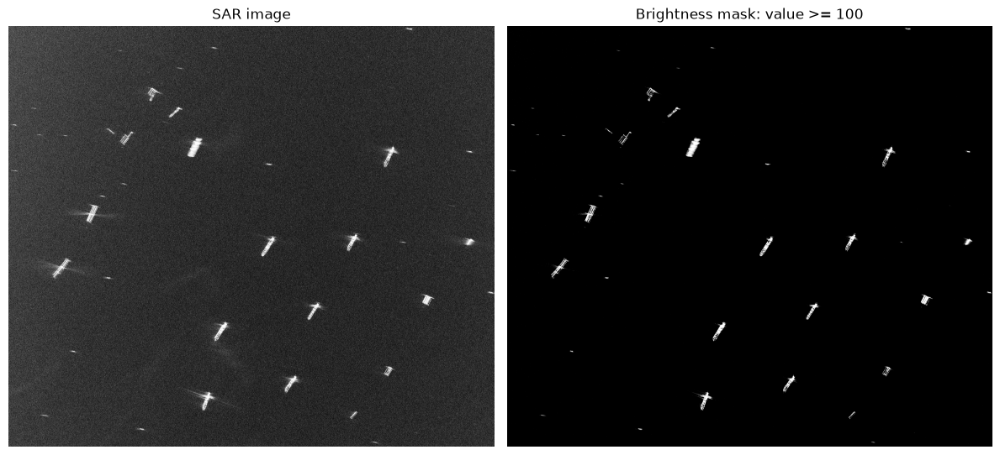

Pixels above threshold: 323454
Fraction of valid pixels above threshold: 0.004235314211581164

Threshold: 110


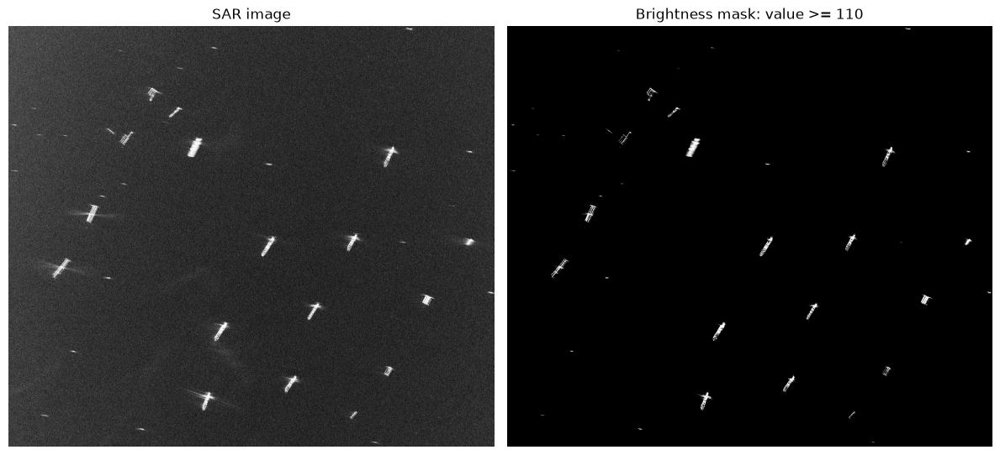

Pixels above threshold: 269345
Fraction of valid pixels above threshold: 0.003526809704991524

Threshold: 120


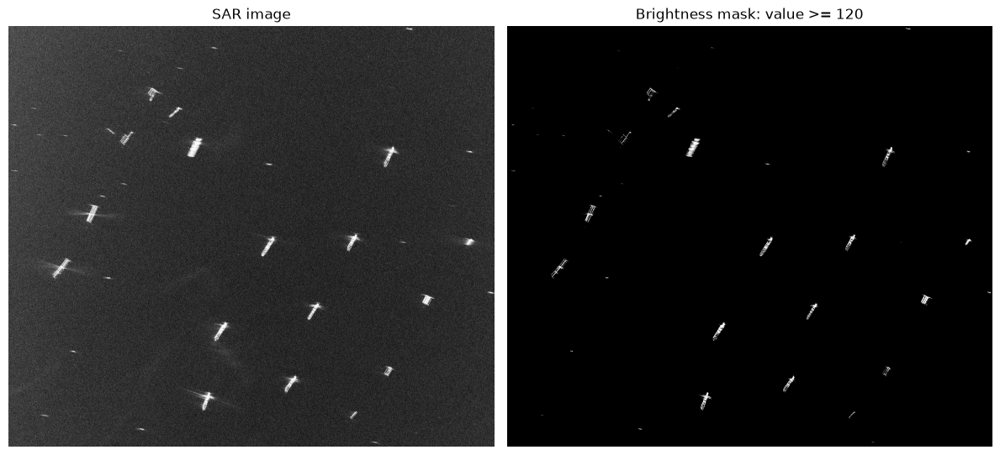

Pixels above threshold: 222481
Fraction of valid pixels above threshold: 0.0029131713971902924

Threshold: 130


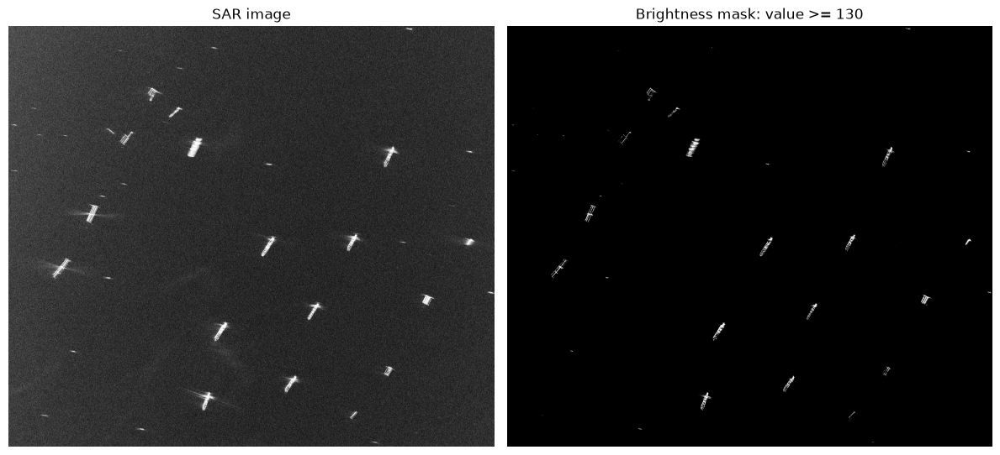

Pixels above threshold: 179626
Fraction of valid pixels above threshold: 0.0023520270287876424

Threshold: 140


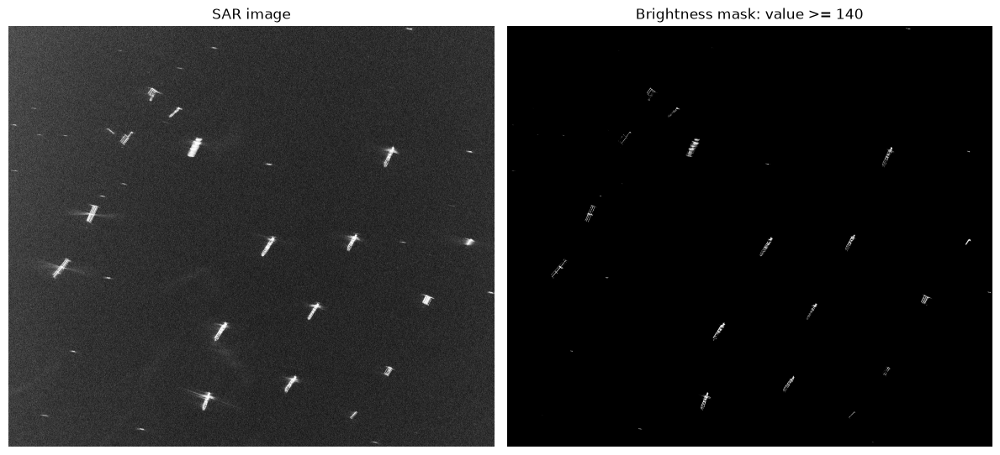

Pixels above threshold: 139902
Fraction of valid pixels above threshold: 0.001831880047328609

Threshold: 200


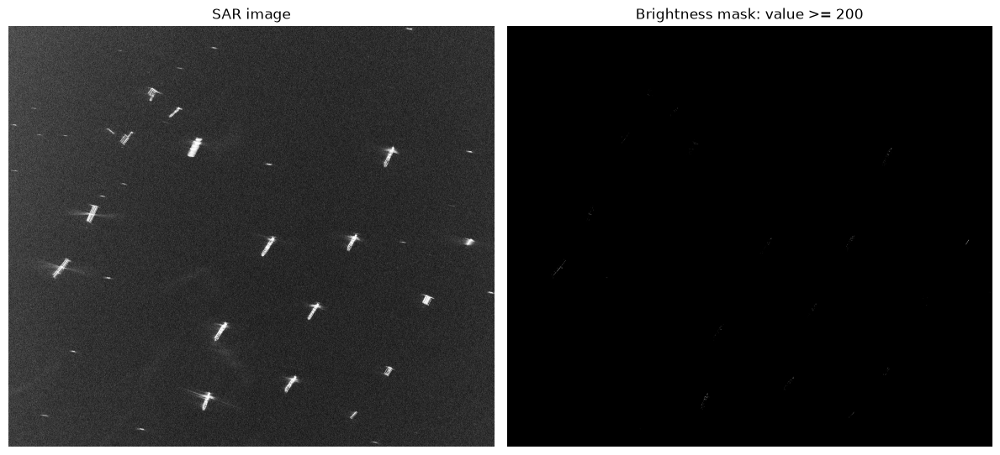

Pixels above threshold: 8667
Fraction of valid pixels above threshold: 0.00011348589991706376


In [7]:
###TRY SOME DIFFERENT THRESHOLDS HERE. PUT YOUR THRESHOLDS IN THE BRACKETS
for threshold in [50, 80, 90, 100, 110, 120, 130, 140, 200]:
    print("\nThreshold:", threshold)
    _ = plot_threshold_mask(arr, threshold=threshold, nodata=nodata)

**QUESTION (10 pts):**
1. Which threshold seems too low?

**ANSWER:** The threshold of 50 seems too low.

2. Which threshold seems too high?

**ANSWER:** The threshold of 200 seems too low.

3. Which threshold would you choose for a first-pass detector?

**ANSWER:** 80 seems like a good threshold.

4. What types of ships or ship parts might be missed by a high threshold?

**ANSWER:** Smaller ships can be missed by a high threshold as well as ship internal structures.

## 5. Connected components

The threshold mask marks bright pixels, not objects. Connected-component labeling groups adjacent bright pixels into candidate objects.

In [8]:
def connected_component_table(mask, arr):
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    img = arr.astype("float32")
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        area = int(component.sum())
        width = x1 - x0
        height = y1 - y0
        values = img[slc][component]
        rows.append({
            "object_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "width_pix": width, "height_pix": height, "area_pix": area,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    table = pd.DataFrame(rows)
    if len(table):
        table = table.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return table, labeled

threshold = 100
img = arr.astype("float32")
valid = np.isfinite(img) & (img != nodata)
mask = (img >= threshold) & valid
component_table, labeled = connected_component_table(mask, arr)
print("Number of connected components:", len(component_table))
display(component_table.head(20))

Number of connected components: 6795


,object_id,x0,y0,x1,y1,width_pix,height_pix,area_pix,mean_brightness,max_brightness
0,3421,4887,4084,5144,4457,257,373,22088,141.993073,255.0
1,6060,3738,7084,3965,7430,227,346,21975,148.802414,255.0
2,2754,1506,3460,1753,3802,247,342,20445,137.180634,255.0
3,4100,854,4527,1188,4862,334,335,18993,139.647873,255.0
4,1887,7254,2319,7497,2721,243,402,18730,145.751892,255.0
5,3338,6541,4032,6754,4344,213,312,17282,145.257782,255.0
6,3537,8842,4121,8992,4246,150,125,8066,140.005203,255.0
7,695,2700,1197,2922,1349,222,152,6500,143.544159,255.0
8,5752,5335,6768,5571,7075,236,307,16751,144.014740,252.0
9,4673,879,4869,914,4882,35,13,228,151.679825,251.0


**QUESTION (5 pts): Look at the number of connected components, printed before the table. Does that match with the approximate number of ships you think you should see? NOTE: The above and below cells only plot connected components and bounding boxes for a small subset of what was found. You can play with these values, but the image might get hard to read.**

**ANSWER:**
It's definitely more that I would expect. To be precise, more connected components that I think the number of ships that are on the SAR image.

## 6. Plot bounding boxes

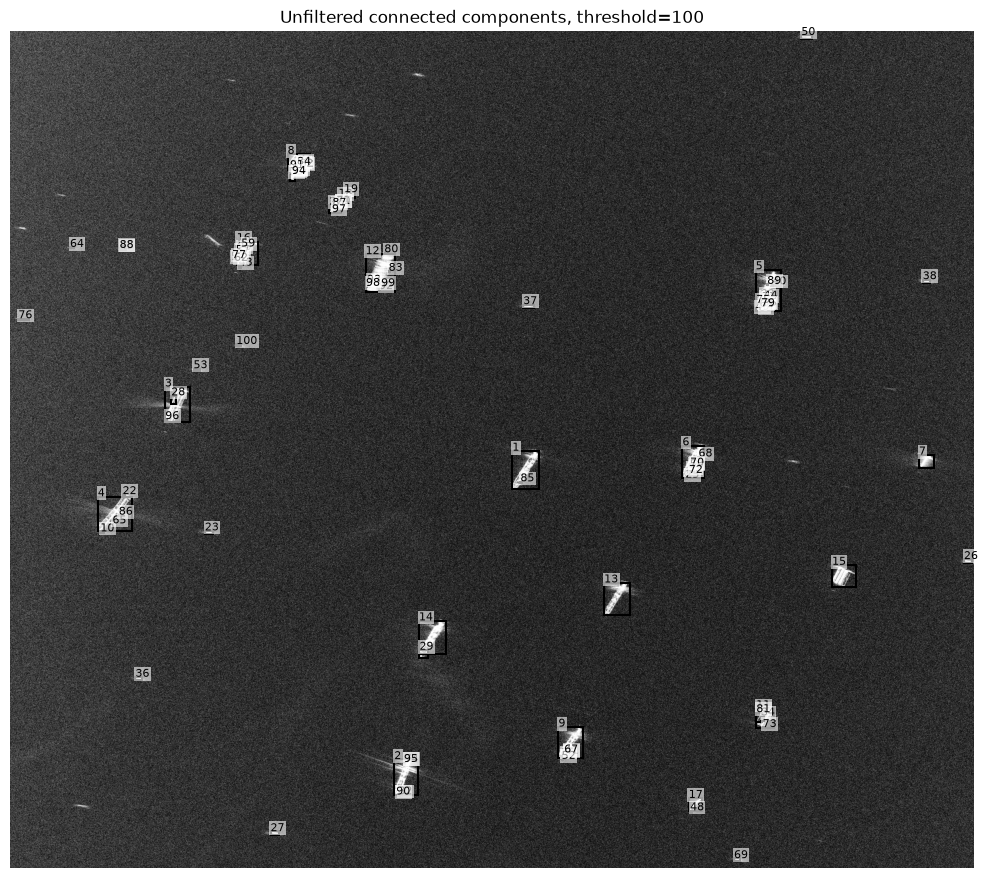

In [9]:
def plot_boxes(arr, candidates, title="Candidate boxes", nodata=0, pmin=1, pmax=99.8, max_boxes=100, label_boxes=True, figsize=(10, 10)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(disp, cmap="gray")
    ax.set_title(title)

    for i, (_, r) in enumerate(candidates.head(max_boxes).iterrows(), start=1):
        rect = Rectangle((r["x0"], r["y0"]), r["x1"] - r["x0"], r["y1"] - r["y0"], fill=False, linewidth=1.5)
        ax.add_patch(rect)
        if label_boxes:
            ax.text(r["x0"], max(r["y0"] - 3, 0), str(i), fontsize=8, bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1))

    ax.axis("off")
    plt.tight_layout()
    plt.show()

plot_boxes(arr, component_table.head(100), title=f"Unfiltered connected components, threshold={threshold}", nodata=nodata)

## 7. Precompiled reference detector

Use this to experiment with parameters before completing your own final detector.

In [14]:
def detect_ship_candidates_precompiled(arr, threshold=120, nodata=0, min_area=100, max_area=500, max_width=120, max_height=120, min_aspect=0.1, max_aspect=10.0, do_closing=True):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    mask = (img >= threshold) & valid
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        area = int(component.sum())
        if area < min_area or area > max_area:
            continue

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        values = img[slc][component]
        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width, "height_pix": height, "area_pix": area, "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled

Detected candidates: 49


,candidate_id,x0,y0,x1,y1,center_x,center_y,width_pix,height_pix,area_pix,aspect,mean_brightness,max_brightness
0,1542,880,4869,913,4880,896.5,4874.5,33,11,176,3.000000,164.153412,251.0
1,1966,7267,6740,7300,6754,7283.5,6747.0,33,14,158,2.357143,164.715195,249.0
2,1295,4890,4394,4911,4411,4900.5,4402.5,21,17,208,1.235294,150.600967,239.0
3,1253,6564,4283,6587,4309,6575.5,4296.0,23,26,208,0.884615,151.331726,230.0
4,685,7295,2612,7315,2645,7305.0,2628.5,20,33,306,0.606061,155.696075,228.0
5,270,2215,2132,2237,2162,2226.0,2147.0,22,30,204,0.733333,165.818634,225.0
6,1308,1097,4507,1117,4529,1107.0,4518.0,20,22,157,0.909091,164.407639,220.0
7,714,7285,2687,7314,2718,7299.5,2702.5,29,31,236,0.935484,145.597458,219.0
8,1262,6571,4307,6603,4338,6587.0,4322.5,32,31,316,1.032258,149.126587,217.0
9,1294,4929,4392,4950,4402,4939.5,4397.0,21,10,125,2.100000,158.936005,216.0


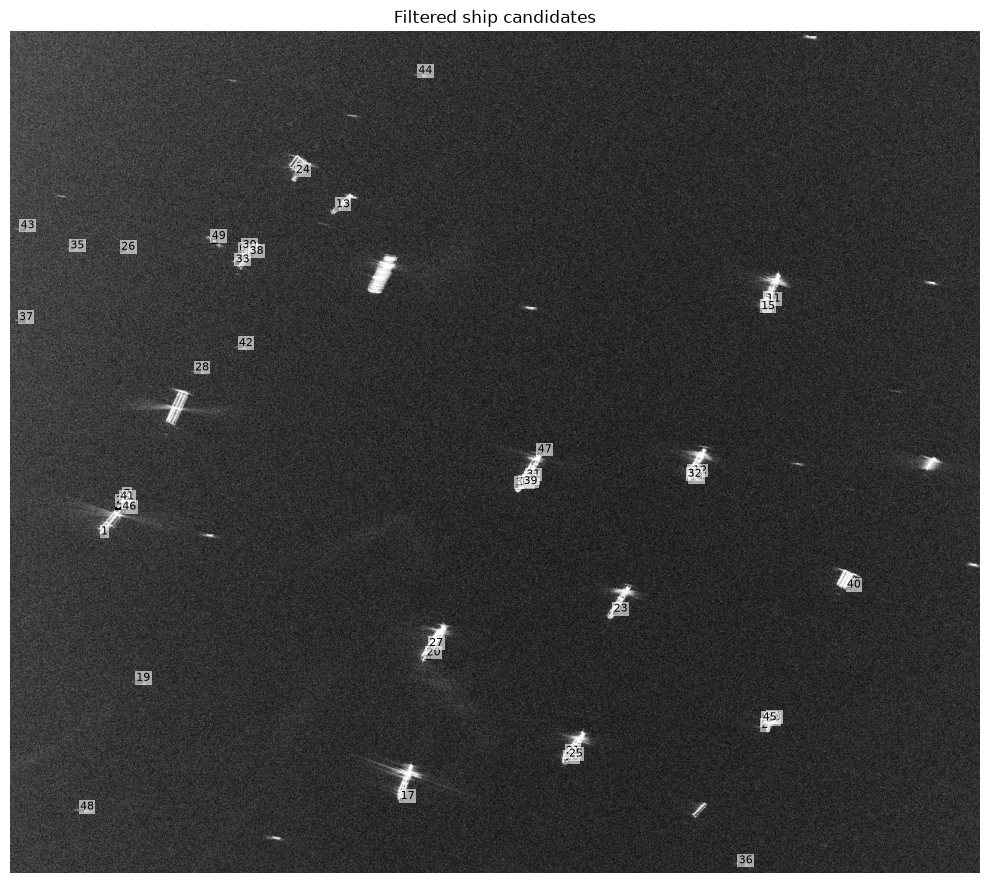

In [16]:
test_candidates, test_mask, test_labeled = detect_ship_candidates_precompiled(arr, threshold=120, nodata=nodata, min_area=100, max_area=500, max_width=120, max_height=120, do_closing=True)
print("Detected candidates:", len(test_candidates))
display(test_candidates.head(30))
plot_boxes(arr, test_candidates, title="Filtered ship candidates", nodata=nodata, max_boxes=1000)

The cell below will allow you to test a few different thresholds and areas at the same time. NOTE: If processing is too slow on your laptop, you can always take a smaller subset from QGIS for testing.


Settings: {'threshold': 80, 'min_area': 20, 'max_area': 800}
Candidate count: 405


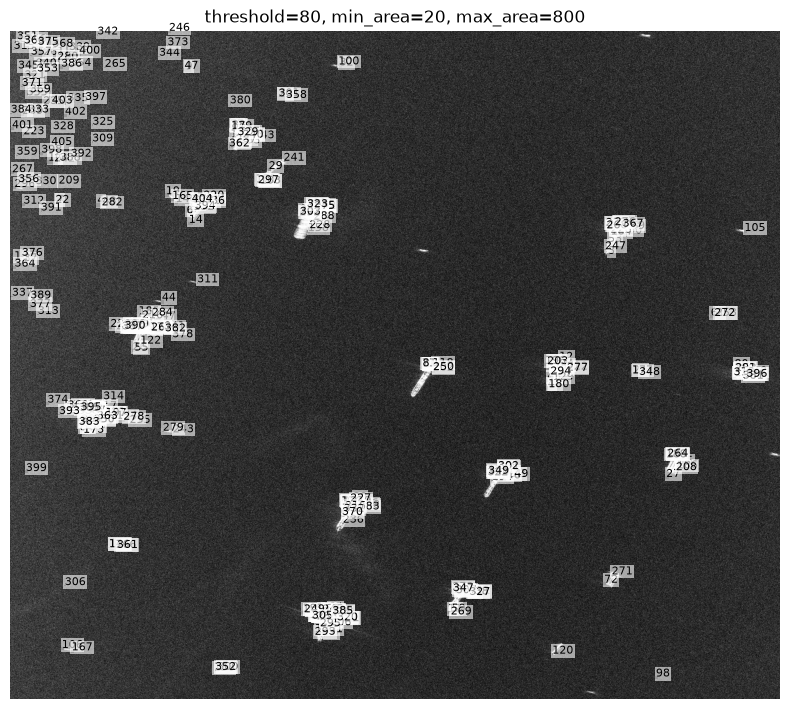


Settings: {'threshold': 100, 'min_area': 40, 'max_area': 500}
Candidate count: 105


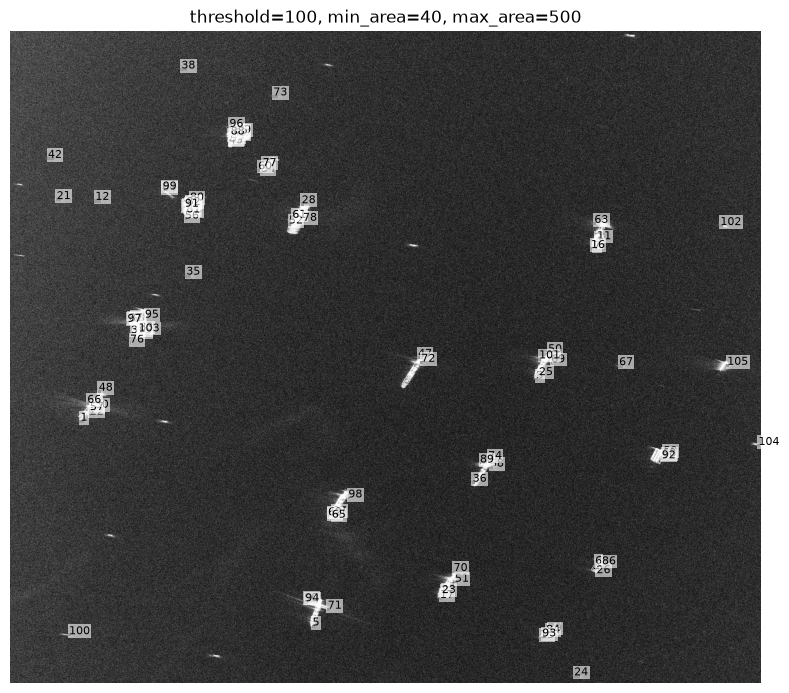


Settings: {'threshold': 120, 'min_area': 50, 'max_area': 500}
Candidate count: 88


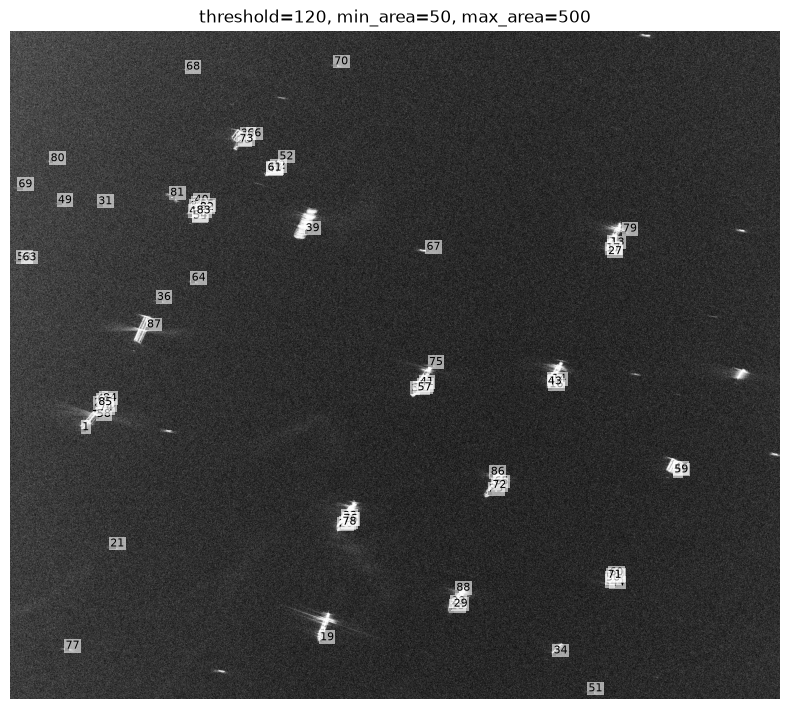

In [18]:
settings = [
    {"threshold": 80, "min_area": 20, "max_area": 800},
    {"threshold": 100, "min_area": 40, "max_area": 500},
    {"threshold": 120, "min_area": 50, "max_area": 500},
]

for s in settings:
    candidates, _, _ = detect_ship_candidates_precompiled(arr, nodata=nodata, max_width=120, max_height=120, do_closing=True, **s)
    print("\nSettings:", s)
    print("Candidate count:", len(candidates))
    plot_boxes(arr, candidates, title=f"threshold={s['threshold']}, min_area={s['min_area']}, max_area={s['max_area']}", nodata=nodata, max_boxes=1000, figsize=(8, 8))

**QUESTION (10 pts):**
1. Which settings produce too many false positives?

**ANSWER:** First setting did produce too many false positives. Like, way too many.

3. Which settings miss obvious ships?

**ANSWER:** Second and third setting did miss obvious ships.

4. Do larger ships split into multiple components?

**ANSWER:** Yes, sometimes they do, in fact, for the second and third setting they did split into multiple components.

# 8. Final coding exercise ﷿﷿﷿﷿﷿﷿﷿﷿﷿ finish the ship detector

**QUESTION (30 pts):**
Adjust the detect_ship_candidates_precompiled() function above to group these candidate detections into individual ships. Right now, single ships are clusters of several to many different individual pieces - this is expected becasue SAR images of individual structures like boats are not uniformly illuminated, meaning there will often be gaps in bright spots. I found the scipy package binary_dilation to be very useful to add here. You will need to adjust the binary_closing if statement to first do binary_dilation, while also getting the structure correct with the merge_distance_pix variable. When compiling the summary statistics table at the end, it will be important to use the original bright pixels inside your grouped boxes to compute brightness, not the dilated pixels. The following code block will help with that:

        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid


In [19]:
from scipy.ndimage import binary_dilation


def detect_ship_candidates_grouped(
    arr,
    threshold=100,
    nodata=0,
    min_area=4,
    max_area=50000,
    max_width=600,
    max_height=600,
    min_aspect=0.05,
    max_aspect=30.0,
    merge_distance_pix=15,
    do_closing=True,
):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    # Start from the original bright pixels, then dilate only for grouping.
    original_mask = (img >= threshold) & valid
    mask = original_mask.copy()

    if do_closing and merge_distance_pix > 0:
        structure = np.ones((3, 3), dtype=bool)
        mask = binary_dilation(
            mask,
            structure=structure,
            iterations=int(merge_distance_pix),
        )
        mask = binary_closing(mask, structure=structure)

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue

        rr, cc = slc
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid
        area = int(original_bright.sum())

        if area < min_area or area > max_area:
            continue

        values = original_component_pixels[original_bright]
        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width,
            "height_pix": height,
            "area_pix": area,
            "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(
            ["max_brightness", "area_pix"],
            ascending=False,
        ).reset_index(drop=True)

    return candidates, mask, labeled


The following cells run and plot the above function.

candidate rows: 39
 candidate_id   x0   y0   x1   y1  center_x  center_y  width_pix  height_pix  area_pix   aspect  mean_brightness  max_brightness
           37 3620 7047 3997 7456    3808.5    7251.5        377         409     17900 0.921760       158.417206           255.0
           24 4867 4046 5168 4477    5017.5    4261.5        301         431     17425 0.698376       150.980026           255.0
           14 7232 2300 7553 2753    7392.5    2526.5        321         453     15662 0.708609       154.964752           255.0
           20 1414 3440 1772 3828    1593.0    3634.0        358         388     14984 0.922680       149.780960           255.0
           23 6521 3994 6802 4379    6661.5    4186.5        281         385     13965 0.729870       154.809952           255.0
           27  831 4474 1219 4901    1025.0    4687.5        388         427     13128 0.908665       155.329758           255.0
            5 2662 1164 2966 1477    2814.0    1320.5        304         313  

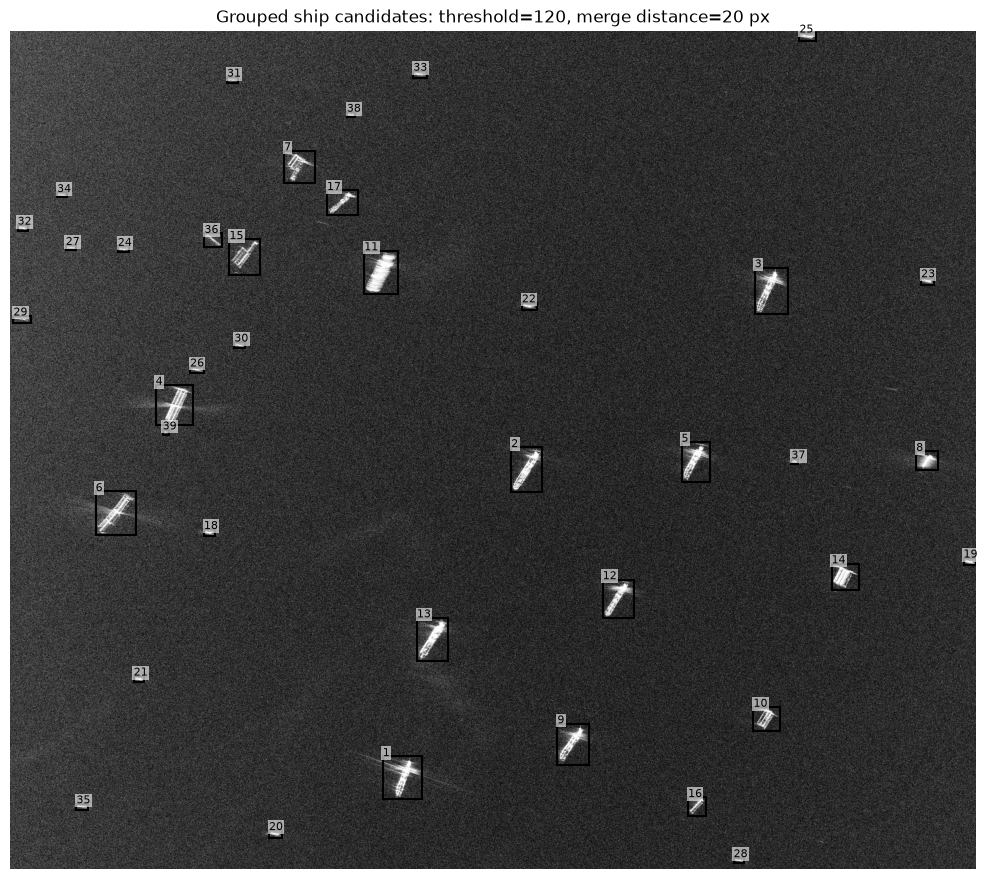

In [20]:
candidates, mask, labeled = detect_ship_candidates_grouped(
    arr,
    threshold=120,
    nodata=nodata,
    min_area=20,
    max_area=70000,
    max_width=700,
    max_height=700,
    merge_distance_pix=20,
)
print("candidate rows:", len(candidates))
print(candidates.head(30).to_string(index=False))

plot_boxes(
    arr,
    candidates,
    title="Grouped ship candidates: threshold=120, merge distance=20 px",
    nodata=nodata,
    max_boxes=1000,
)


## 9. Short interpretation note
**QUESTION (20 pts):**
Write 1 paragraph describing which parameters you settled on and why.

- Which threshold and size filters did you choose?
- Did your detector mostly find ships, or did it also detect clutter?
- What false positives remain? What false negatives remain?
- What types of ships might be missed?

**ANSWER:**
I settled on a brightness threshold of 120, a minimum original bright-pixel area of 20 pixels, a maximum area of 70,000 pixels, maximum box dimensions of 700 by 700 pixels, and a merge distance of 20 pixels. The threshold is high enough to remove much of the dim background water clutter while still keeping the main bright returns from smaller ships, and the dilation-based merge step groups the separated bright scatterers on large ships into one candidate box instead of many fragments. With these settings the detector returns 39 grouped candidates, so it mostly finds ship-like targets but it is still not a perfect ship detector: some bright port structures, wake-like returns, or other compact clutter may remain as false positives, while very small, dim, or low-backscatter ships can be missed. Very large ships or tightly clustered ships can also still be difficult because dilation may either split one vessel if its bright parts are too far apart or merge nearby vessels into one grouped object. But in general, it seems that detector did a good job with detecting ships and even though there might be some false positives on the left side and sum unmarked ships on the right side (unlikely, though) it seems that most ships are marked correctly and big ships are not split into smaller components.


## Optional extension

Run the same detector on another subset, such as a Sliding Spotlight or Stripmap scene. Do the same thresholds work? Which mode makes ship detection easiest?

In [21]:
# OPTIONAL: try another scene from the manifest.

# SCENE_INDEX = 1
# row = df.iloc[SCENE_INDEX]
# path = ROOT / row["local_path"]
#
# with rasterio.open(path) as src:
#     arr2 = src.read(1)
#     nodata2 = src.nodata if src.nodata is not None else 0
#
# plot_sar(arr2, title=f"{row['scene_id']} | {row['mode']} | {row['polarization']}", nodata=nodata2)
#
# candidates2, mask2, labeled2 = detect_ship_candidates(arr2, threshold=210, nodata=nodata2, min_area=4, max_area=500, max_width=120, max_height=120, do_closing=True)
# print("Detected candidates:", len(candidates2))
# display(candidates2.head(30))
# plot_boxes(arr2, candidates2, title="Optional second-scene detections", nodata=nodata2)

NameError: name 'df' is not defined